# Loading the data

In [ ]:
!wget --header="Host: mycityreport.s3-ap-northeast-1.amazonaws.com" --header="User-Agent: Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/87.0.4280.141 Safari/537.36" --header="Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/avif,image/webp,image/apng,*/*;q=0.8,application/signed-exchange;v=b3;q=0.9" --header="Accept-Language: en-US,en;q=0.9,mr;q=0.8" --header="Referer: https://github.com/sekilab/RoadDamageDetector" "https://mycityreport.s3-ap-northeast-1.amazonaws.com/02_RoadDamageDataset/public_data/IEEE_bigdata_RDD2020/train.tar.gz" -c -O 'train.tar.gz'

--2025-03-21 08:26:14--  https://mycityreport.s3-ap-northeast-1.amazonaws.com/02_RoadDamageDataset/public_data/IEEE_bigdata_RDD2020/train.tar.gz
Resolving mycityreport.s3-ap-northeast-1.amazonaws.com (mycityreport.s3-ap-northeast-1.amazonaws.com)... 3.5.158.201, 3.5.158.52, 3.5.154.50, ...
Connecting to mycityreport.s3-ap-northeast-1.amazonaws.com (mycityreport.s3-ap-northeast-1.amazonaws.com)|3.5.158.201|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1472626254 (1.4G) [application/x-tar]
Saving to: ‘train.tar.gz’

train.tar.gz        100%[===================>]   1.37G  4.33MB/s    in 2m 21s  

2025-03-21 08:28:36 (9.94 MB/s) - ‘train.tar.gz’ saved [1472626254/1472626254]



In [ ]:
!tar -zxf ./train.tar.gz

In [ ]:
!mkdir /content/data
!mkdir /content/data/Images

In [ ]:
import os
import shutil
import numpy as np
import pandas as pd
from xml.etree import ElementTree
import random

base_dir = '/content/train/'
countries = ['Czech', 'India', 'Japan']
classes = ['D00', 'D10','D20', 'D40']

def convert(size, box):
    dw = 1./size[0]
    dh = 1./size[1]
    x = (box[0] + box[1])/2.0
    y = (box[2] + box[3])/2.0
    w = box[1] - box[0]
    h = box[3] - box[2]
    x = x*dw
    w = w*dw
    y = y*dh
    h = h*dh
    return (x,y,w,h)

for c in countries:
  xml_files = sorted(os.listdir(base_dir+c+'/annotations/xmls/'))
  image_files = sorted(os.listdir(base_dir+c+'/images/'))

  #Considering images which have objetcs
  for i in range(len(xml_files)):
    infile_xml = open(base_dir+c+'/annotations/xmls/'+xml_files[i])
    tree = ElementTree.parse(infile_xml)
    root = tree.getroot()
    size = root.find('size')
    w = int(size.find('width').text)
    h = int(size.find('height').text)

    if root.find('object'):       #if there exist any object
      objects = []
      for obj in root.iter('object'):
        objects.append(obj.find('name').text)
      if any(i in classes for i in objects):
        file_name = xml_files[i].split('.')[0]
        out_file = open('/content/data/Images/'+file_name+'.txt', 'w')
        for obj in root.iter('object'):
          cls = obj.find('name').text
          if cls not in classes:
              continue
          cls_id = classes.index(cls)
          xmlbox = obj.find('bndbox')
          b = (float(xmlbox.find('xmin').text), float(xmlbox.find('xmax').text), float(xmlbox.find('ymin').text), float(xmlbox.find('ymax').text))
          bb = convert((w,h), b)
          out_file.write(str(cls_id) + " " + " ".join([str(a) for a in bb]) + '\n')

        shutil.move(base_dir+c+'/images/'+image_files[i], '/content/data/Images/')

In [ ]:
image_dirs = sorted(['/content/data/Images/'+i for i in os.listdir('/content/data/Images') if i.split('.')[1] == 'jpg'])
print('total no of images: ',len(image_dirs))

random.shuffle(image_dirs)

train_images = image_dirs[:10000]
val_images = image_dirs[10000:11000]
test_images = image_dirs[11000:]

print('no of train samples:', len(train_images))
print('no of val samples:', len(val_images))
print('no of test samples:', len(test_images))

def list_to_file(dir, my_list):
  with open(dir, 'w') as f:
    for item in my_list:
      f.write("%s\n" % item)

list_to_file('/content/data/train.txt', train_images)
list_to_file('/content/data/val.txt', val_images)
list_to_file('/content/data/test.txt', test_images)

total no of images:  12195
no of train samples: 10000
no of val samples: 1000
no of test samples: 1195


# Importing ultralytics for training on yolov11 model

In [ ]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 949.8/949.8 kB 26.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 107.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 59.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 49.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 13.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 93.0 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstal

In [ ]:
from ultralytics import YOLO
model = YOLO("yolo11n.pt")

In [ ]:
import os
import yaml

# Function to parse label_map.pbtxt and extract class names
def parse_label_map(label_map_path):
    class_names = []
    with open(label_map_path, 'r') as f:
        lines = f.readlines()
        class_name = None
        for line in lines:
            # Look for lines that contain the 'name' field
            if 'name' in line:
                class_name = line.strip().split(': ')[1].strip('\'"')  # Get the class name
                class_names.append(class_name)
    return class_names

# Define the paths to the dataset
dataset_dir = "/content/data"
train_txt_path = os.path.join(dataset_dir, "train.txt")
test_txt_path = os.path.join(dataset_dir, "test.txt")
val_txt_path = os.path.join(dataset_dir, "val.txt")

# Path to label_map.pbtxt (replace with your actual path)
label_map_path = "/content/data/label_map.pbtxt"

# Parse the label_map.pbtxt to get class names
class_names = parse_label_map(label_map_path)

# Create the YAML structure
data_yaml = {
    'train': train_txt_path,  # Path to the file containing paths to training images
    'val': val_txt_path,     # Path to the file containing paths to validation images
    'test': test_txt_path,    # Path to the file containing paths to testing images
    'nc': len(class_names),   # Number of classes
    'names': class_names      # List of class names
}

# Write the data.yaml file
yaml_file_path = os.path.join(dataset_dir, "data.yaml")

with open(yaml_file_path, 'w') as f:
    yaml.dump(data_yaml, f, default_flow_style=False)

print(f"YAML file created successfully at {yaml_file_path}")

✅ YAML file created successfully at /content/data/data.yaml


In [ ]:
from google.colab import files

uploaded = files.upload()

Saving best.pt to best.pt


In [ ]:
shutil.move("best.pt", "/content/best.pt")

'/content/best.pt'

In [ ]:
from ultralytics import YOLO

# Load the uploaded best.pt model
model = YOLO("/content/best.pt")  # Make sure the path is correct

# Resume training
results = model.train(data="/content/data/data.yaml", epochs=20, pretrained=True)

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=/content/best.pt, data=/content/data/data.yaml, epochs=20, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_d

100%|██████████| 755k/755k [00:00<00:00, 20.1MB/s]



                   from  n    params  module                                       arguments                     
  0                  -1  1       464  ultralytics.nn.modules.conv.Conv             [3, 16, 3, 2]                 
  1                  -1  1      4672  ultralytics.nn.modules.conv.Conv             [16, 32, 3, 2]                
  2                  -1  1      6640  ultralytics.nn.modules.block.C3k2            [32, 64, 1, False, 0.25]      
  3                  -1  1     36992  ultralytics.nn.modules.conv.Conv             [64, 64, 3, 2]                
  4                  -1  1     26080  ultralytics.nn.modules.block.C3k2            [64, 128, 1, False, 0.25]     
  5                  -1  1    147712  ultralytics.nn.modules.conv.Conv             [128, 128, 3, 2]              
  6                  -1  1     87040  ultralytics.nn.modules.block.C3k2            [128, 128, 1, True]           
  7                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128

100%|██████████| 5.35M/5.35M [00:00<00:00, 82.4MB/s]


AMP: checks passed ✅


train: Scanning /content/data/Images... 10000 images, 1 backgrounds, 0 corrupt: 100%|██████████| 10000/10000 [00:22<00:00, 436.22it/s]


train: New cache created: /content/data/Images.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/data/Images... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:02<00:00, 430.15it/s]


val: New cache created: /content/data/Images.cache
Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.00125, momentum=0.9) with parameter groups 81 weight(decay=0.0), 88 weight(decay=0.0005), 87 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train
Starting training for 20 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/20      2.27G      1.898       2.16      1.726         48        640: 100%|██████████| 625/625 [03:29<00:00,  2.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:11<00:00,  2.70it/s]

                   all       1000       2062      0.422      0.378      0.358      0.151



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/20      2.68G      1.912      2.215      1.748         48        640: 100%|██████████| 625/625 [03:21<00:00,  3.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.01it/s]


                   all       1000       2062      0.386      0.318      0.322      0.137

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/20      2.69G      1.943      2.264      1.759         63        640: 100%|██████████| 625/625 [03:20<00:00,  3.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.18it/s]


                   all       1000       2062      0.378      0.333      0.291       0.12

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/20      2.69G      1.941      2.257      1.753         46        640: 100%|██████████| 625/625 [03:19<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.19it/s]


                   all       1000       2062       0.39      0.354      0.309      0.128

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/20      2.69G      1.914      2.226      1.737         55        640: 100%|██████████| 625/625 [03:17<00:00,  3.16it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.07it/s]


                   all       1000       2062      0.389      0.346      0.322      0.138

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/20      2.69G      1.889      2.189      1.725         57        640: 100%|██████████| 625/625 [03:19<00:00,  3.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.06it/s]


                   all       1000       2062      0.411      0.364      0.342      0.145

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/20      2.69G       1.87      2.139      1.708         46        640: 100%|██████████| 625/625 [03:18<00:00,  3.15it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.09it/s]


                   all       1000       2062      0.436      0.383      0.367      0.155

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/20      2.69G      1.864      2.123        1.7         45        640: 100%|██████████| 625/625 [03:17<00:00,  3.17it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.06it/s]


                   all       1000       2062      0.407      0.423      0.376      0.163

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/20      2.69G      1.845      2.075      1.678         43        640: 100%|██████████| 625/625 [03:21<00:00,  3.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.30it/s]


                   all       1000       2062      0.452      0.403      0.396      0.172

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/20      2.69G       1.84      2.057      1.677         65        640: 100%|██████████| 625/625 [03:19<00:00,  3.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.14it/s]


                   all       1000       2062      0.463      0.434      0.414       0.18
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/20      2.69G      1.854      2.019      1.741         29        640: 100%|██████████| 625/625 [03:15<00:00,  3.19it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.34it/s]


                   all       1000       2062      0.501      0.445       0.44      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/20      2.69G      1.836      1.976       1.72         40        640: 100%|██████████| 625/625 [03:11<00:00,  3.26it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.07it/s]


                   all       1000       2062       0.52       0.45      0.458      0.203

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/20      2.69G      1.816      1.923      1.707         37        640: 100%|██████████| 625/625 [03:13<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.11it/s]


                   all       1000       2062      0.507      0.438      0.456      0.205

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/20      2.69G      1.805      1.895      1.707         23        640: 100%|██████████| 625/625 [03:12<00:00,  3.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.04it/s]


                   all       1000       2062      0.537      0.461      0.477      0.212

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/20       2.7G      1.791      1.866      1.688         31        640: 100%|██████████| 625/625 [03:14<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.36it/s]


                   all       1000       2062      0.519      0.486       0.48      0.216

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/20       2.7G      1.772      1.831       1.67         30        640: 100%|██████████| 625/625 [03:12<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.13it/s]


                   all       1000       2062      0.543      0.477       0.49      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/20       2.7G      1.767      1.799      1.666         30        640: 100%|██████████| 625/625 [03:13<00:00,  3.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.11it/s]


                   all       1000       2062      0.526       0.47      0.484      0.225

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/20       2.7G      1.744      1.769      1.648         30        640: 100%|██████████| 625/625 [03:13<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.06it/s]


                   all       1000       2062      0.537      0.497      0.507      0.238

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/20       2.7G      1.732       1.73      1.638         31        640: 100%|██████████| 625/625 [03:14<00:00,  3.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:09<00:00,  3.46it/s]


                   all       1000       2062      0.547      0.504      0.508      0.242

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/20       2.7G      1.722      1.708      1.626         25        640: 100%|██████████| 625/625 [03:15<00:00,  3.20it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:10<00:00,  3.08it/s]


                   all       1000       2062      0.556      0.511      0.516      0.243

20 epochs completed in 1.157 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 5.5MB
Optimizer stripped from runs/detect/train/weights/best.pt, 5.5MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLO11n summary (fused): 100 layers, 2,582,932 parameters, 0 gradients, 6.3 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 32/32 [00:12<00:00,  2.58it/s]


                   all       1000       2062      0.556      0.512      0.516      0.243
                   D00        376        510      0.551      0.459      0.483      0.225
                   D10        214        385      0.479      0.452      0.401      0.164
                   D20        577        730      0.617      0.673      0.685      0.362
                   D40        246        437       0.58      0.465      0.496       0.22
Speed: 0.3ms preprocess, 2.4ms inference, 0.0ms loss, 2.3ms postprocess per image
Results saved to runs/detect/train


In [ ]:
with open("/content/data/val.txt", "r") as f:
    val_image_paths = f.read().splitlines()


image 1/1 /content/data/Images/Japan_005187.jpg: 640x640 1 D00, 1 D10, 8.7ms
Speed: 2.7ms preprocess, 8.7ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)


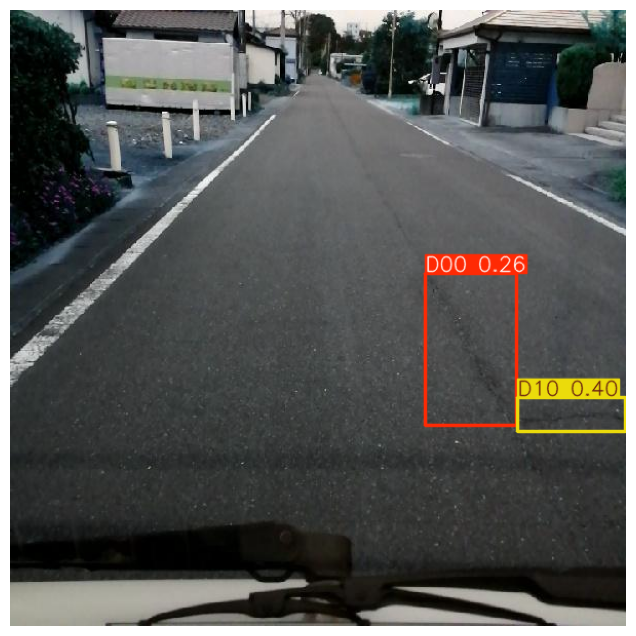


image 1/1 /content/data/Images/Japan_011783.jpg: 640x640 1 D20, 15.9ms
Speed: 7.7ms preprocess, 15.9ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


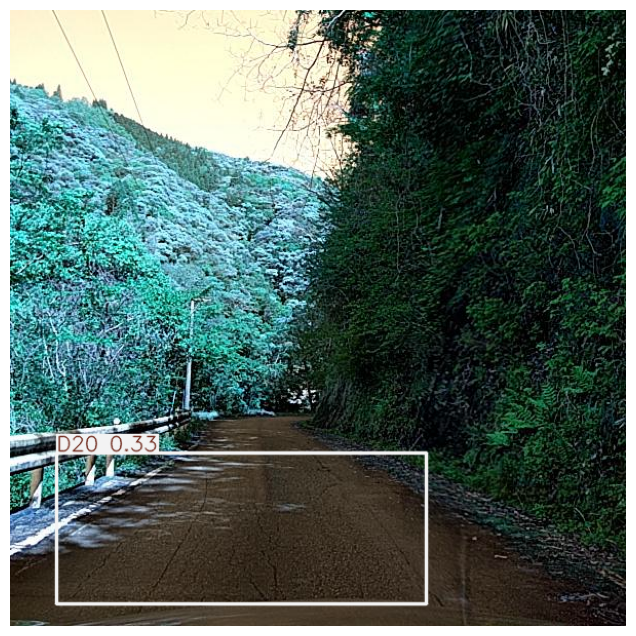


image 1/1 /content/data/Images/India_002522.jpg: 640x640 1 D00, 1 D20, 13.7ms
Speed: 4.4ms preprocess, 13.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


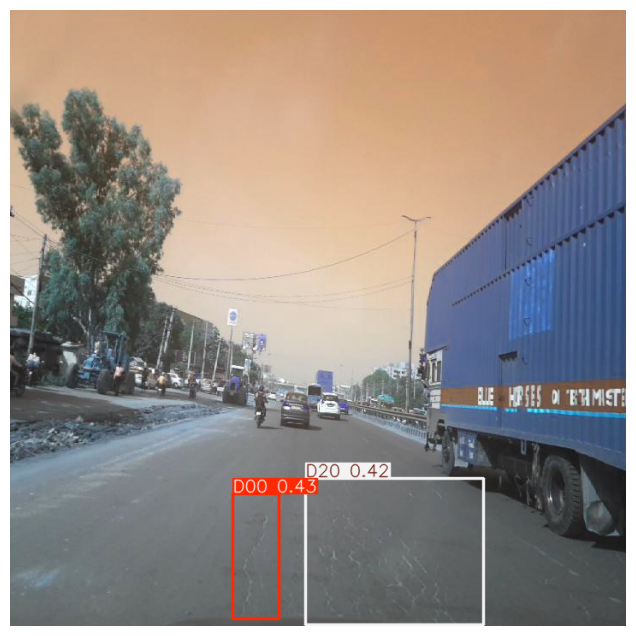


image 1/1 /content/data/Images/Japan_004139.jpg: 640x640 1 D20, 15.3ms
Speed: 5.1ms preprocess, 15.3ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


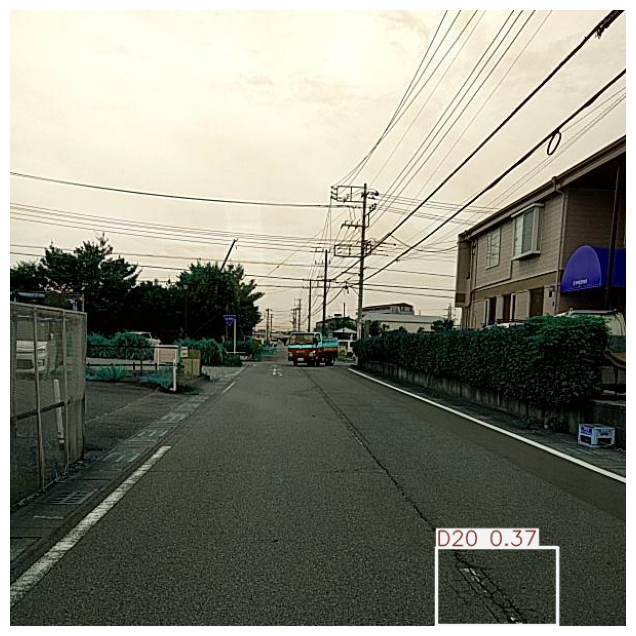


image 1/1 /content/data/Images/Japan_001242.jpg: 640x640 1 D20, 15.1ms
Speed: 4.9ms preprocess, 15.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


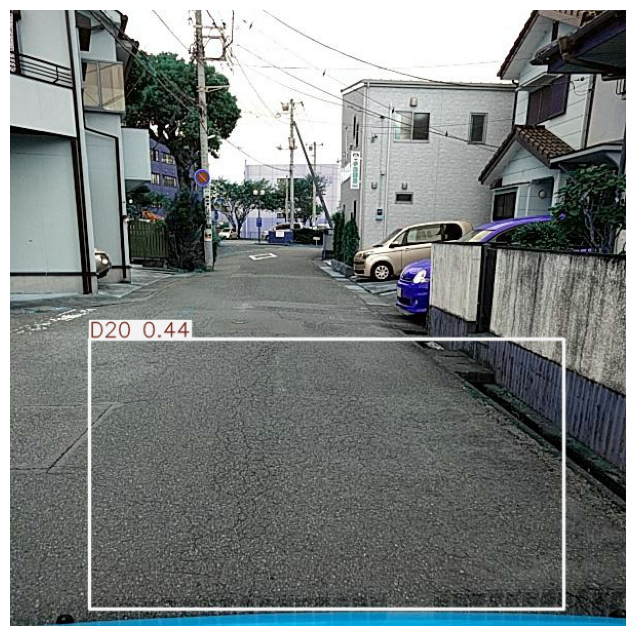


image 1/1 /content/data/Images/India_001006.jpg: 640x640 1 D40, 17.1ms
Speed: 4.7ms preprocess, 17.1ms inference, 1.8ms postprocess per image at shape (1, 3, 640, 640)


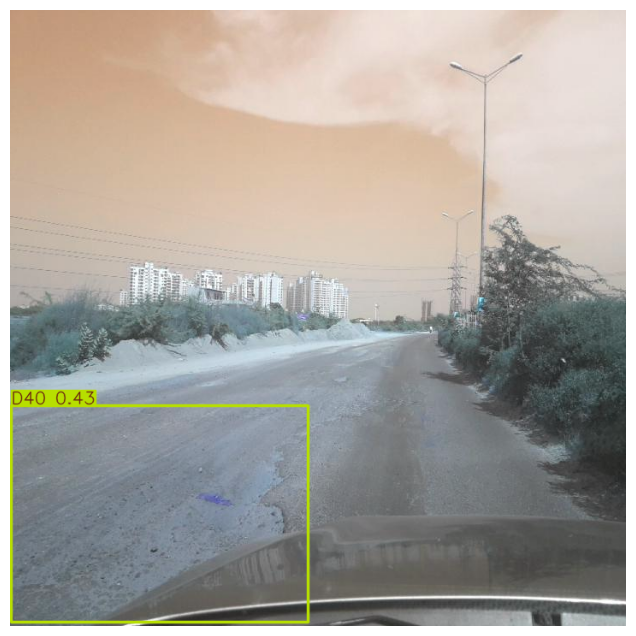


image 1/1 /content/data/Images/Japan_012807.jpg: 640x640 1 D10, 1 D20, 16.5ms
Speed: 4.4ms preprocess, 16.5ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


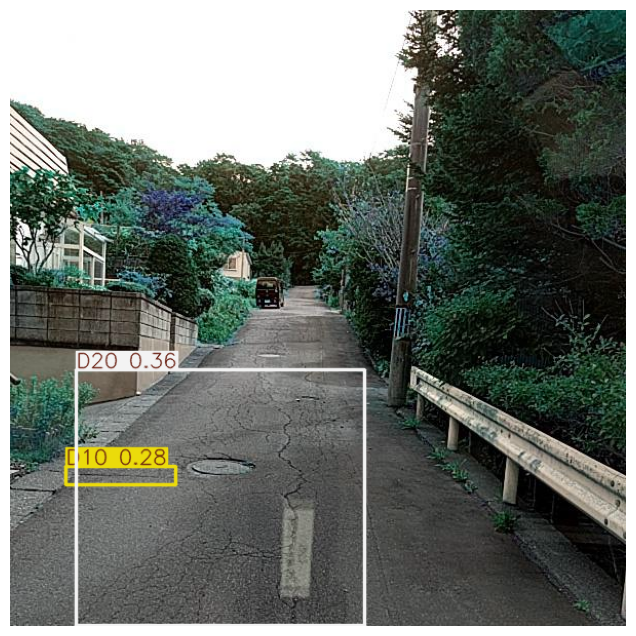


image 1/1 /content/data/Images/India_004730.jpg: 640x640 1 D20, 16.2ms
Speed: 5.4ms preprocess, 16.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


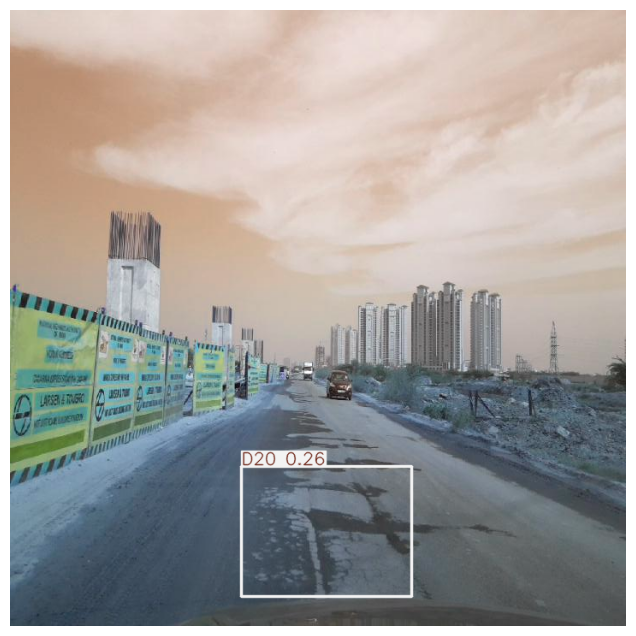


image 1/1 /content/data/Images/Japan_002394.jpg: 640x640 1 D10, 2 D20s, 16.2ms
Speed: 8.4ms preprocess, 16.2ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)


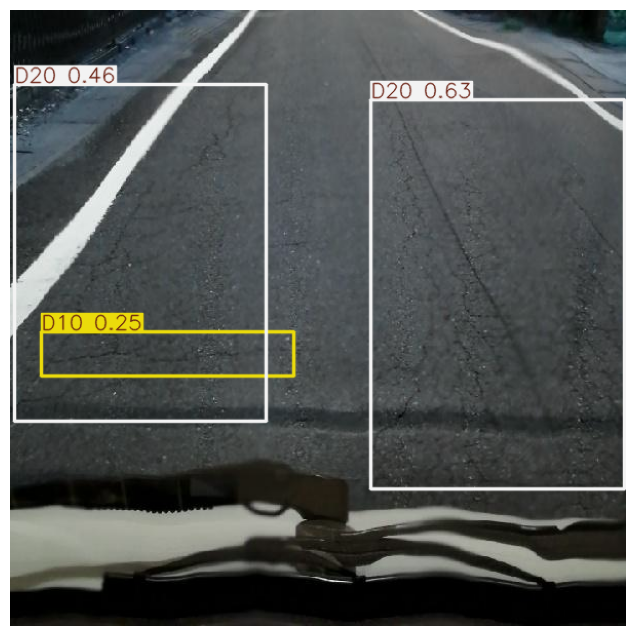


image 1/1 /content/data/Images/India_008731.jpg: 640x640 (no detections), 14.6ms
Speed: 8.7ms preprocess, 14.6ms inference, 0.8ms postprocess per image at shape (1, 3, 640, 640)


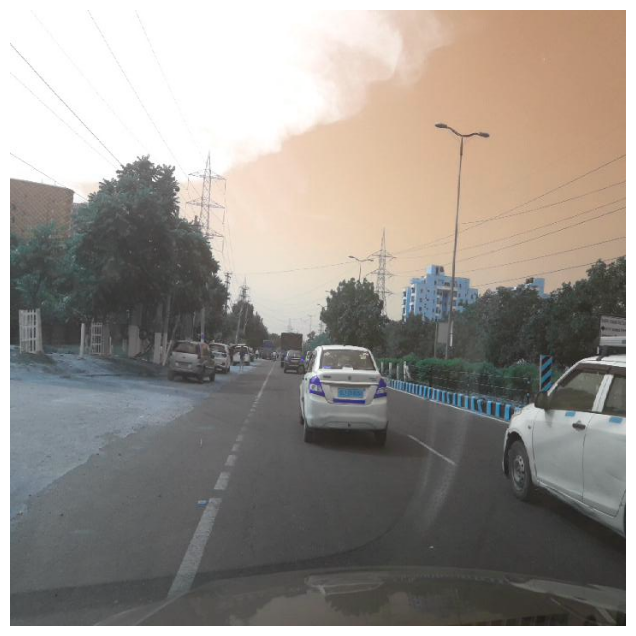

In [ ]:
import matplotlib.pyplot as plt
model = YOLO('/content/runs/detect/train/weights/best.pt')
for img_path in val_image_paths[:10]:  # Adjust the range if needed
    results = model.predict(img_path)  # Run inference on the validation image
    annotated_img = results[0].plot()  # Annotated image with predictions

    plt.figure(figsize=(8, 8))
    plt.imshow(annotated_img)
    plt.axis('off')  # Hide axes
    plt.show()

In [ ]:
val_results = model.val(data='/content/data/data.yaml',split='val')


Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/data/Images.cache... 1000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1000/1000 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 63/63 [00:12<00:00,  5.22it/s]


                   all       1000       2062      0.558      0.512      0.516      0.243
                   D00        376        510      0.551      0.458      0.482      0.224
                   D10        214        385      0.478      0.452      0.401      0.164
                   D20        577        730      0.618      0.673      0.685      0.362
                   D40        246        437      0.583      0.464      0.496      0.221
Speed: 0.8ms preprocess, 3.9ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/val4


In [ ]:
# Extract results dictionary
results_dict = val_results.results_dict

# Print results to console
print("\n=== Validation Results ===")
print(f"Precision: {results_dict['metrics/precision(B)']:.4f}")
print(f"Recall: {results_dict['metrics/recall(B)']:.4f}")
print(f"mAP@0.5: {results_dict['metrics/mAP50(B)']:.4f}")
print(f"mAP@0.5:0.95: {results_dict['metrics/mAP50-95(B)']:.4f}")

print("\n=== Per-Class mAP@0.5 ===")
for idx, class_name in val_results.names.items():
    print(f" {class_name}: {val_results.box.maps[idx]:.4f}")

print("\n=== Speed Metrics ===")
print(f"Preprocess Time: {val_results.speed['preprocess']:.2f} ms")
print(f"Inference Time: {val_results.speed['inference']:.2f} ms")
print(f"Postprocess Time: {val_results.speed['postprocess']:.2f} ms")


=== 📊 Validation Results ===
📌 Precision: 0.5577
📌 Recall: 0.5116
📌 mAP@0.5: 0.5160
📌 mAP@0.5:0.95: 0.2428

=== 🔍 Per-Class mAP@0.5 ===
🔹 D00: 0.2243
🔹 D10: 0.1643
🔹 D20: 0.3617
🔹 D40: 0.2209

=== ⚡ Speed Metrics ===
🕒 Preprocess Time: 0.79 ms
🕒 Inference Time: 3.86 ms
🕒 Postprocess Time: 1.45 ms


In [ ]:
test_results = model.val(data='/content/data/data.yaml', split='test', imgsz=640)

# Extract results dictionary
results_dict = test_results.results_dict

# Print results to console
print("\n=== 📊 Test Results ===")
print(f"Precision: {results_dict['metrics/precision(B)']:.4f}")
print(f"Recall: {results_dict['metrics/recall(B)']:.4f}")
print(f"mAP@0.5: {results_dict['metrics/mAP50(B)']:.4f}")
print(f"mAP@0.5:0.95: {results_dict['metrics/mAP50-95(B)']:.4f}")

print("\n=== Per-Class mAP@0.5 ===")
for idx, class_name in test_results.names.items():
    print(f"{class_name}: {test_results.box.maps[idx]:.4f}")

print("\n===  Speed Metrics ===")
print(f"Preprocess Time: {test_results.speed['preprocess']:.2f} ms")
print(f"Inference Time: {test_results.speed['inference']:.2f} ms")
print(f" Postprocess Time: {test_results.speed['postprocess']:.2f} ms")

Ultralytics 8.3.94 🚀 Python-3.11.11 torch-2.6.0+cu124 CUDA:0 (Tesla T4, 15095MiB)


val: Scanning /content/data/Images... 1195 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1195/1195 [00:01<00:00, 599.54it/s]

val: New cache created: /content/data/Images.cache



                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:14<00:00,  5.20it/s]


                   all       1195       2488      0.544      0.504      0.514      0.236
                   D00        476        671      0.541      0.449      0.471      0.214
                   D10        267        455      0.468      0.448      0.407      0.155
                   D20        630        795      0.614       0.65      0.673      0.354
                   D40        297        567      0.555      0.469      0.506      0.219
Speed: 0.7ms preprocess, 4.1ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to runs/detect/val5

=== 📊 Test Results ===
📌 Precision: 0.5443
📌 Recall: 0.5040
📌 mAP@0.5: 0.5143
📌 mAP@0.5:0.95: 0.2355

=== 🔍 Per-Class mAP@0.5 ===
🔹 D00: 0.2139
🔹 D10: 0.1547
🔹 D20: 0.3544
🔹 D40: 0.2191

=== ⚡ Speed Metrics ===
🕒 Preprocess Time: 0.69 ms
🕒 Inference Time: 4.06 ms
🕒 Postprocess Time: 1.53 ms



image 1/1 /content/data/Images/Japan_006528.jpg: 640x640 2 D10s, 2 D20s, 10.1ms
Speed: 3.4ms preprocess, 10.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


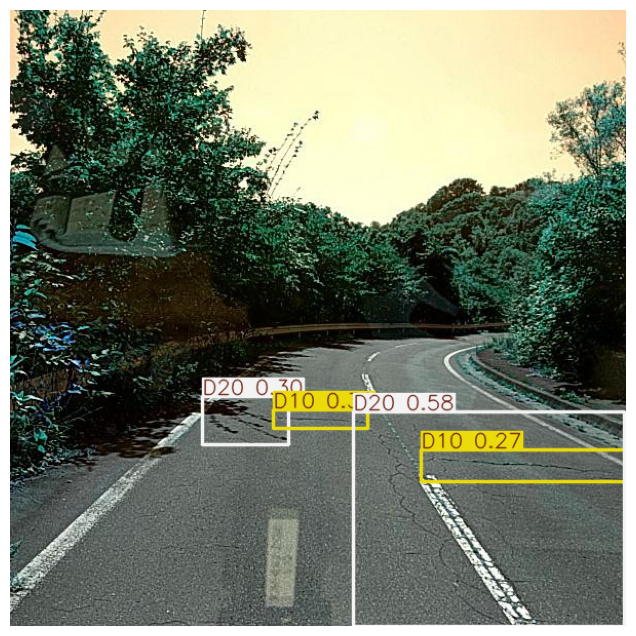


image 1/1 /content/data/Images/Japan_003867.jpg: 640x640 2 D00s, 15.2ms
Speed: 4.6ms preprocess, 15.2ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 640)


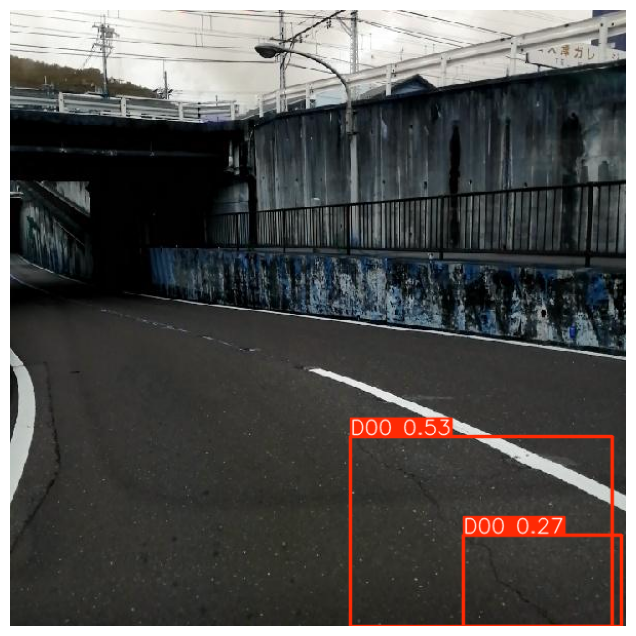


image 1/1 /content/data/Images/Japan_011328.jpg: 640x640 5 D40s, 16.0ms
Speed: 4.5ms preprocess, 16.0ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


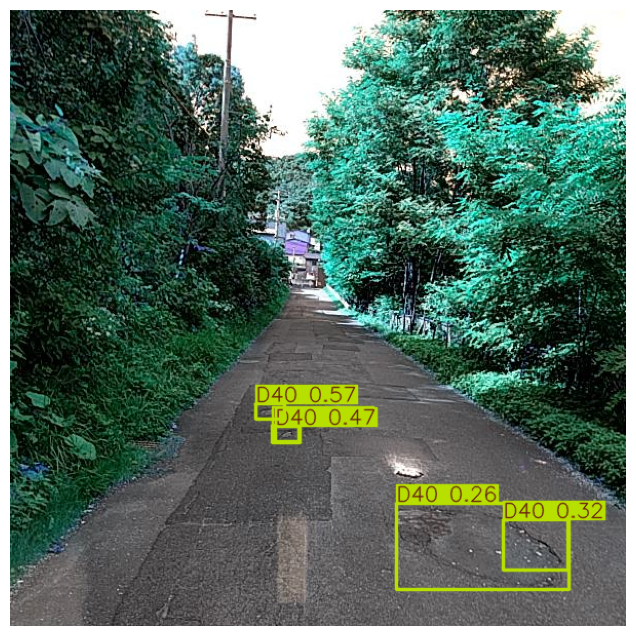


image 1/1 /content/data/Images/Japan_010267.jpg: 640x640 1 D00, 1 D10, 14.2ms
Speed: 4.7ms preprocess, 14.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


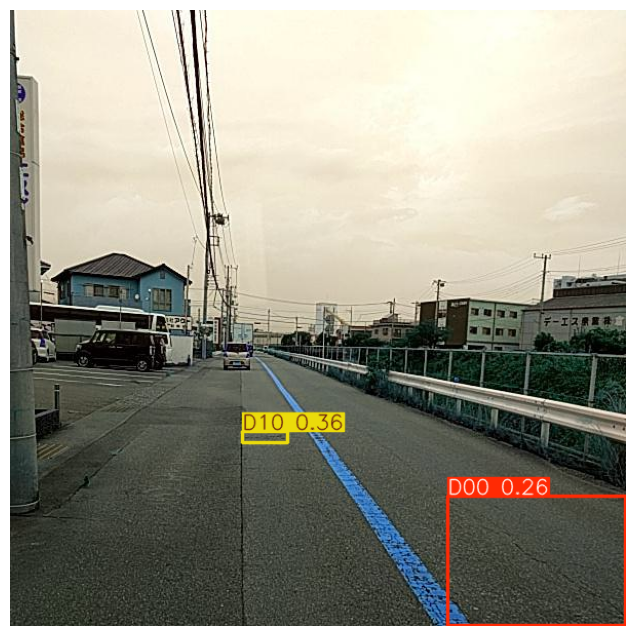


image 1/1 /content/data/Images/Japan_012643.jpg: 640x640 2 D20s, 18.1ms
Speed: 4.9ms preprocess, 18.1ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


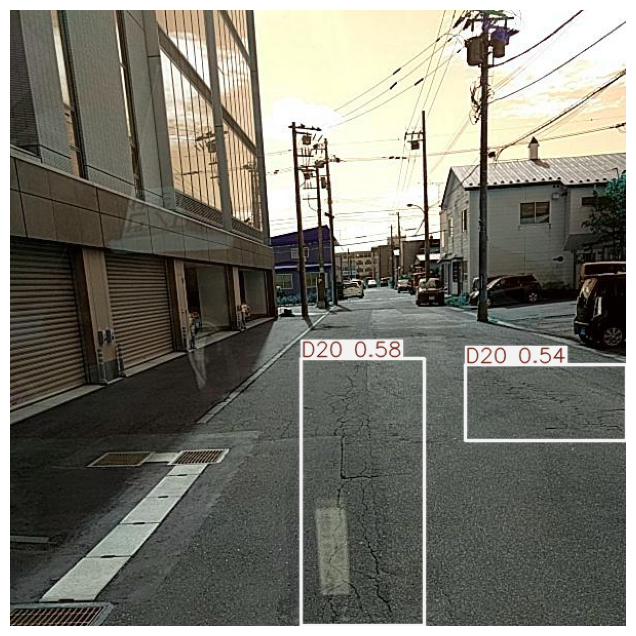


image 1/1 /content/data/Images/Japan_009556.jpg: 640x640 1 D20, 17.2ms
Speed: 5.8ms preprocess, 17.2ms inference, 1.9ms postprocess per image at shape (1, 3, 640, 640)


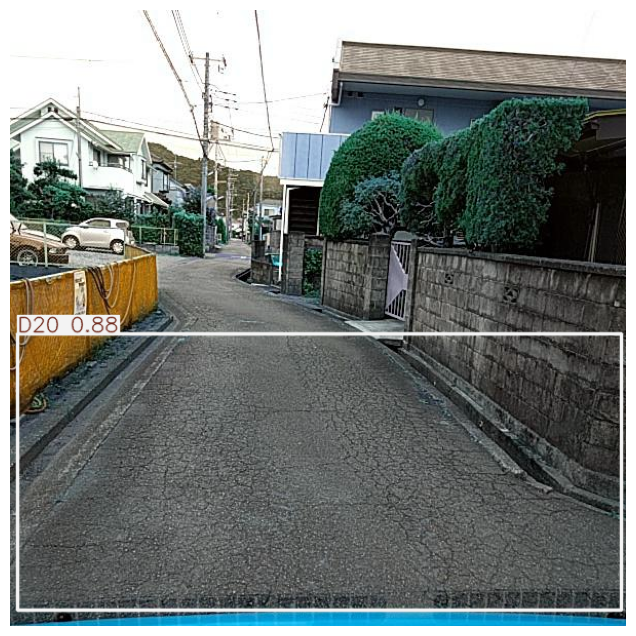


image 1/1 /content/data/Images/Japan_001119.jpg: 640x640 2 D20s, 18.0ms
Speed: 4.1ms preprocess, 18.0ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


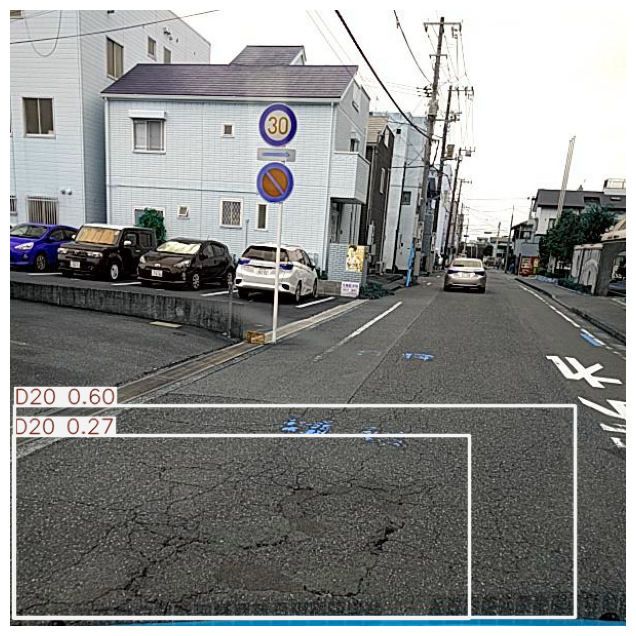


image 1/1 /content/data/Images/Japan_012113.jpg: 640x640 (no detections), 13.7ms
Speed: 4.5ms preprocess, 13.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


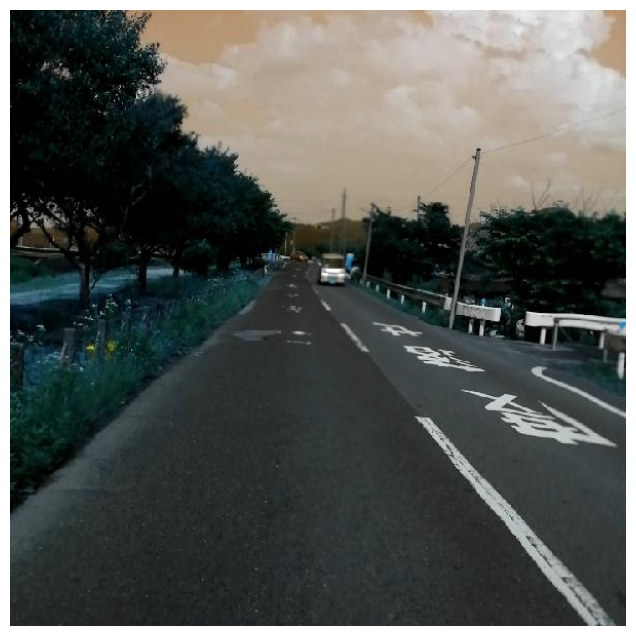


image 1/1 /content/data/Images/India_002594.jpg: 640x640 2 D20s, 21.3ms
Speed: 5.5ms preprocess, 21.3ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


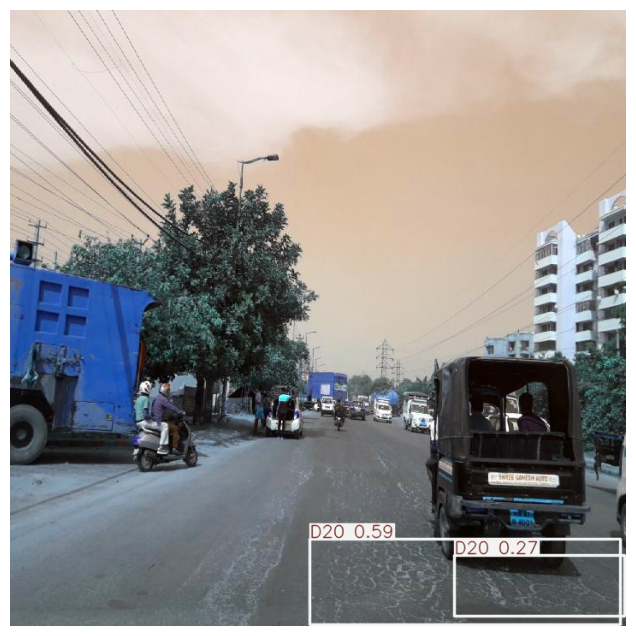


image 1/1 /content/data/Images/Japan_006527.jpg: 640x640 1 D00, 18.7ms
Speed: 4.5ms preprocess, 18.7ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


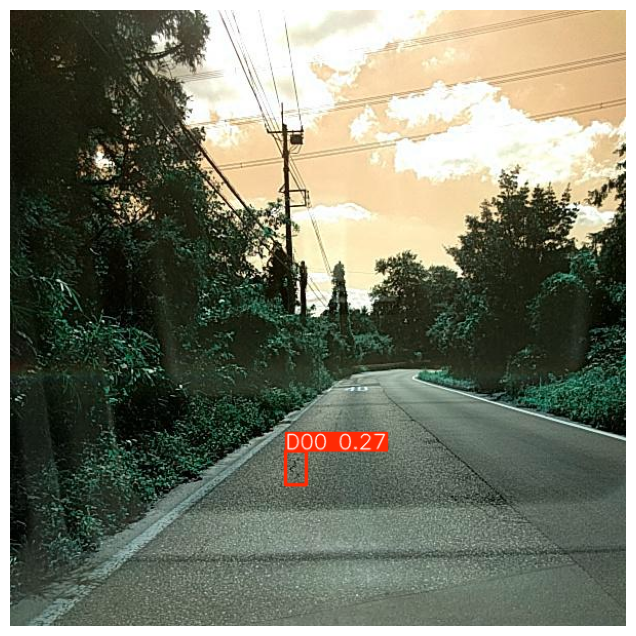

In [ ]:
with open("/content/data/test.txt", "r") as f:
    test_image_paths = f.read().splitlines()

import matplotlib.pyplot as plt
model = YOLO('/content/runs/detect/train/weights/best.pt')
for img_path in test_image_paths[:10]:  # Adjust the range if needed
    results = model.predict(img_path)  # Run inference on the validation image
    annotated_img = results[0].plot()  # Annotated image with predictions

    plt.figure(figsize=(8, 8))
    plt.imshow(annotated_img)
    plt.axis('off')  # Hide axes
    plt.show()

In [37]:
# Final pipeline

In [38]:
import torch
import cv2
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt

def func(input_file):
    # Load YOLOv8 model
    model = YOLO('/content/runs/detect/train/weights/best.pt')  # Update path to best.pt

    # Class names
    classes = ['D00', 'D10', 'D20', 'D40']
    alt_names = {'D00': 'lateral_crack', 'D10': 'linear_cracks', 'D20': 'aligator_cracks', 'D40': 'potholes'}

    # Read image
    frame = cv2.imread(input_file)

    # Run inference
    results = model(input_file)

    # Extract detections
    for result in results:
        for box in result.boxes:
            x1, y1, x2, y2 = map(int, box.xyxy[0])  # Bounding box (x1, y1, x2, y2)
            conf = float(box.conf[0])  # Confidence score
            cls = int(box.cls[0])  # Class index

            # Get class name
            label = classes[cls]
            alt_label = alt_names[label]

            # Draw bounding box
            color = (0, 255, 0)  # Green
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            text = f"{alt_label}: {conf:.2f}"
            cv2.putText(frame, text, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)

    # Display image
    plt.figure(figsize=(8, 8))
    plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()


In [50]:
from google.colab import files

uploaded = files.upload()

Saving file-16089009.jpg to file-16089009.jpg



image 1/1 /content/train/file-16089009.jpg: 480x640 3 D40s, 51.0ms
Speed: 2.5ms preprocess, 51.0ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)


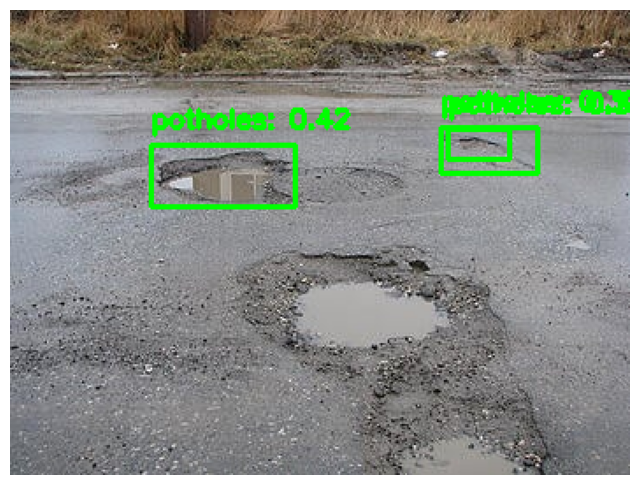

In [51]:
func('/content/train/file-16089009.jpg')
